# Latest Mark 3
Featuring **histogram matching**

In [163]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [164]:
def read_files(ddir):
    images = dict()
    ACCEPTED_FORMAT = ['jpg', 'png']
    for d in sorted(os.listdir(ddir)):
        if d.split('.')[1].lower() in ACCEPTED_FORMAT:
            fname = d.split('.')[0]
            print(f'reading {os.path.join(ddir, d)}...')
            images[fname] = cv2.imread(os.path.join(ddir, d))
            images[fname] = cv2.cvtColor(images[fname], cv2.COLOR_BGR2RGB)
    return images

def display_all(imgs, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def display_all_with(imgs, cc, subs=(10,10), fgsz=(15,18), use_gray=True):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k][:,:,cc], cmap='gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def save_plots(imgs, suptitle, savedir, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
    fig.suptitle(suptitle)
    fig.savefig(savedir) 

def adjust_gamma(image, gamma=1.0):
    table = np.array([((i / 255.0) ** gamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)

In [165]:
POSITIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive'
NEGATIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/negative'
IDEAL = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/drishtiGS_069.png'

In [166]:
pos = read_files(POSITIVE)

reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/036.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/069.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/158.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/159.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/160.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/228.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/229.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/245.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/247.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/273.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/277.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/289.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/293.jpg...
reading /hom

In [167]:
ideal = cv2.imread(IDEAL)
ideal = cv2.cvtColor(ideal, cv2.COLOR_BGR2RGB)

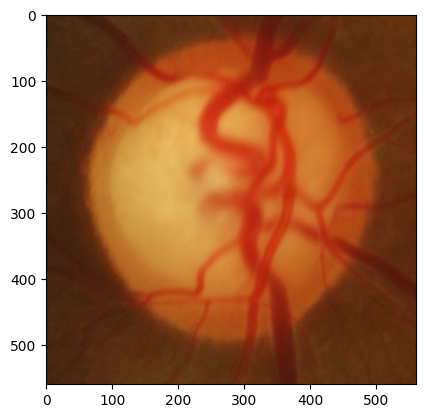

In [168]:
plt.imshow(ideal)

# Histogram Matching

In [169]:
from skimage.exposure import match_histograms

In [170]:
pos_matched = {}

for p in pos:
    pos_matched[p] = match_histograms(pos[p], ideal, multichannel=True)

/tmp/ipykernel_1134165/767392457.py:4: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pos_matched[p] = match_histograms(pos[p], ideal, multichannel=True)


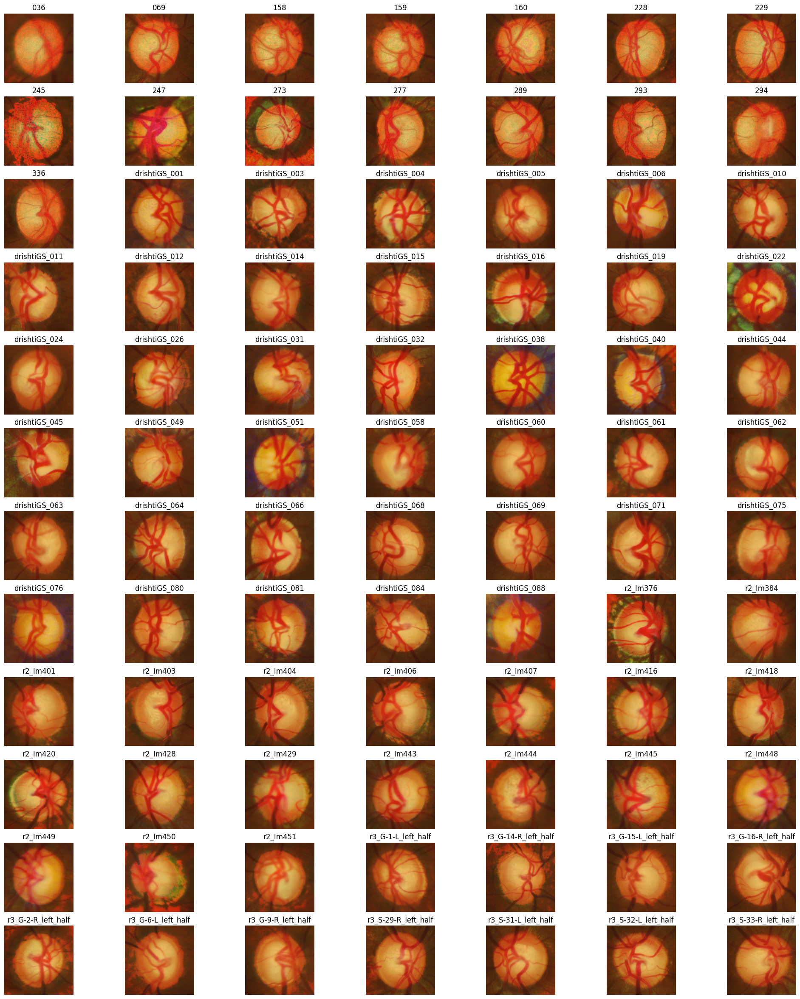

In [171]:
display_all(pos_matched, (12,7), (25,30))

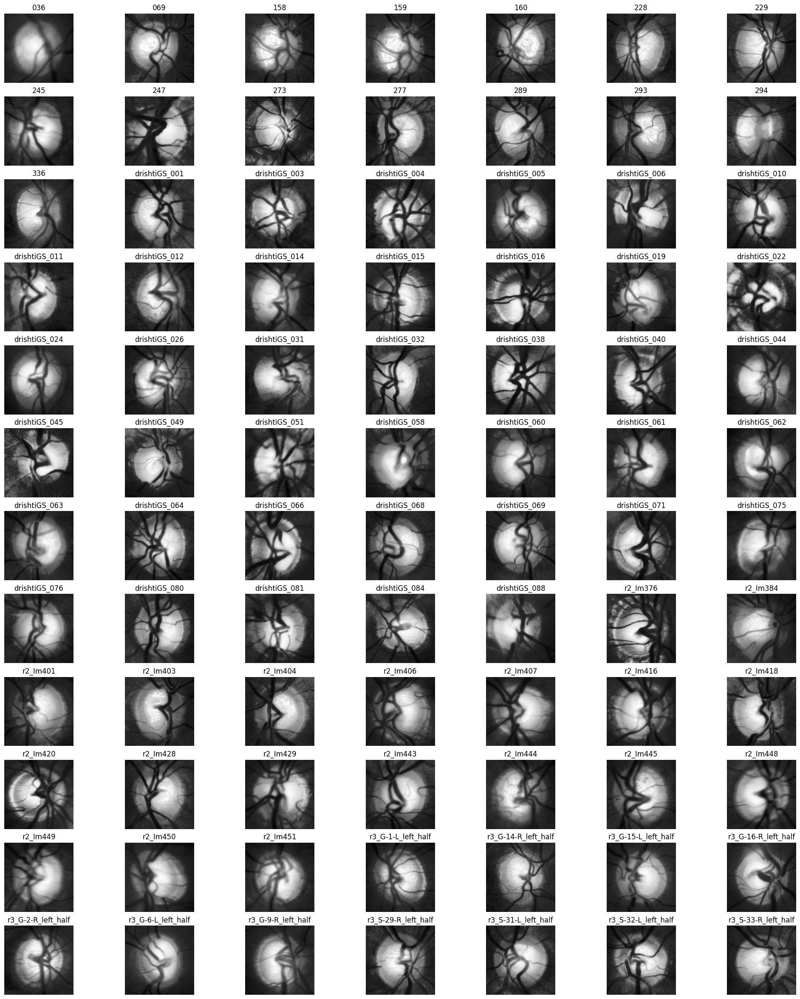

In [172]:
display_all_with(pos_matched, 1, (12,7), (25,30), True)

In [173]:
def get_circle(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    (x,y), radius = cv2.minEnclosingCircle(contours[cont_idx])
    return (x,y), radius

def select_boundaries(bnrs, img):
    cont, hcy = cv2.findContours(bnrs, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    (x,y),radius = get_circle(cont)
    center = (int(x),int(y))
    radius = int(radius)
    return center, radius

def extract_oc(imgs, ori):
    # p = {}
    oc_line = {}
    ocs = {}
    close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (55,55))
    print('extracting oc...')
    for img in imgs:
        green = imgs[img][:,:,1]
        blur = cv2.GaussianBlur(green, (15,15), 0)
        gmc = adjust_gamma(blur, 6)
        ret3, th3 = cv2.threshold(
            gmc,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        binaries = cv2.morphologyEx(th3, cv2.MORPH_CLOSE, close_kernel)
        center, radius = select_boundaries(binaries, imgs[img])
        oc_line[img] = cv2.circle(ori[img],center,radius,(0,255,0), 2)
        canvas = np.zeros_like(th3, dtype='uint8')
        ocs[img] = cv2.circle(canvas, center, radius, (255, 255, 255), -1)
        
        
        # p[img] = cv2.erode(gmc, kernel=np.ones((25, 25), np.uint8))
    # display_all(p, (12,7), (25,30), True)
    
    return oc_line, ocs

In [174]:
oc_lines, all_oc = extract_oc(pos_matched, pos)

extracting oc...


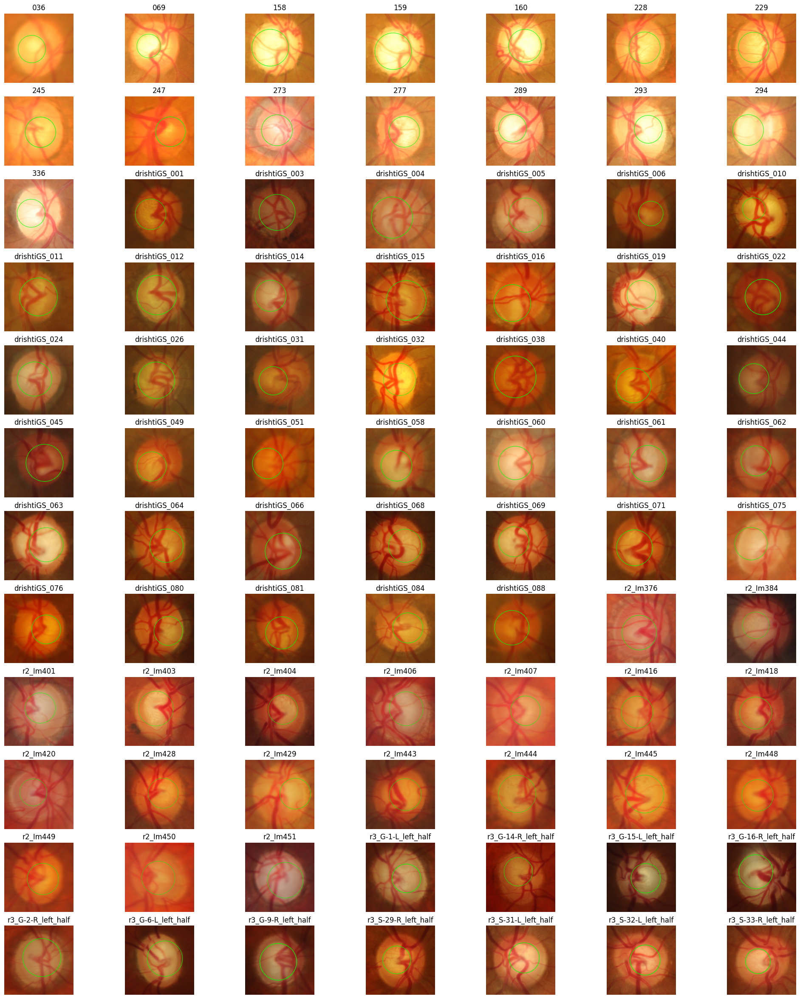

In [175]:
display_all(oc_lines, (12,7), (25,30))

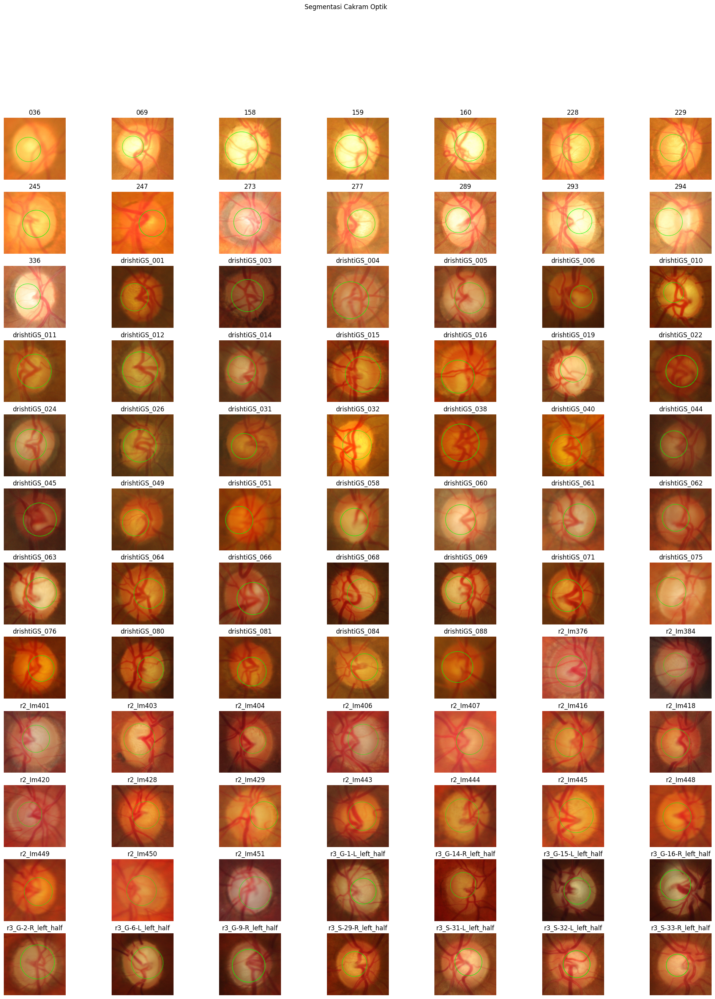

In [176]:
save_plots(oc_lines, 'Segmentasi Cakram Optik', '/home/tsdhrm/Pictures/cakramOptik.png', (12,7), (25,30))